# Imports

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import numpy as np
import time
import math
from scipy.optimize import least_squares
from plyfile import PlyData
import open3d as o3d

# Image Display

Displaying some sample images from the data.

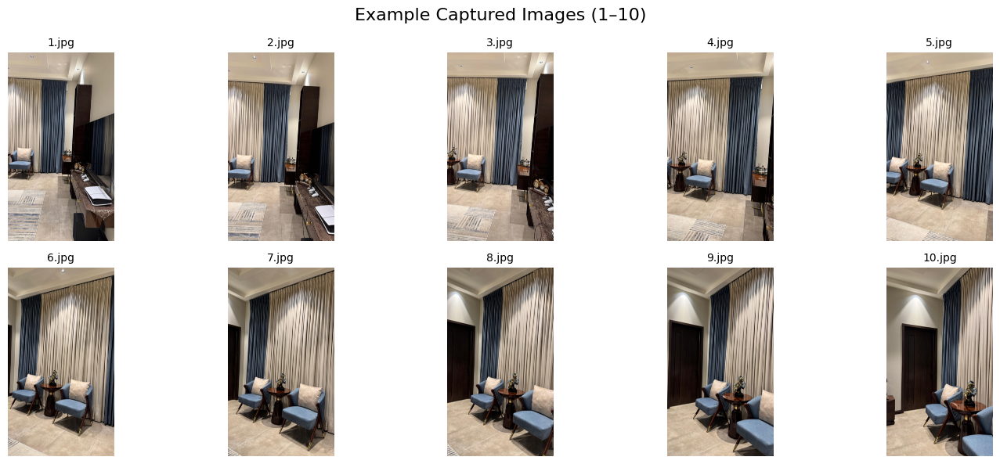

In [2]:
data_folder = 'data'

image_files = sorted([os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.lower().endswith(('.jpg', '.png'))],
    key=lambda x: int(os.path.splitext(os.path.basename(x))[0])
)

example_images = image_files[:10]

#display in grid
def display_image_grid(images, rows=2, cols=5, figsize=(15, 6)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()
    for i, img_path in enumerate(images):
        img = io.imread(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        title = os.path.basename(img_path)
        axes[i].set_title(title, fontsize=10)
    plt.suptitle("Example Captured Images (1–10)", fontsize=16)
    plt.tight_layout()
    plt.show()

display_image_grid(example_images)

# Preprocessing

Resizing and Grayscaling the images from the dataset.

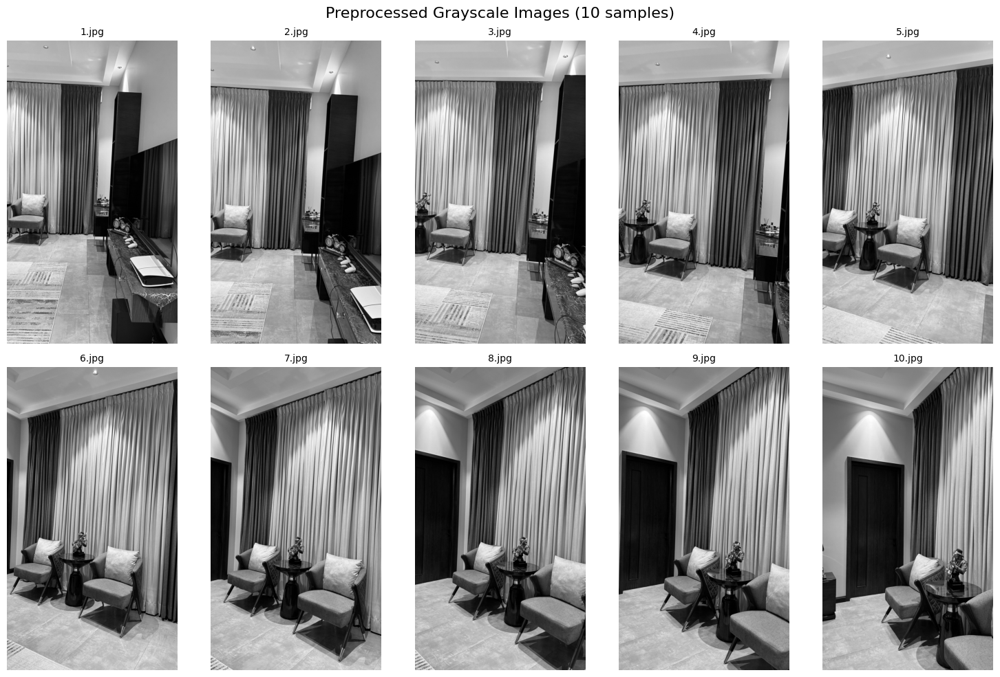

In [3]:
def preprocess_image_gray(image, max_dim=1440):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape[:2]
    scale = max_dim / max(h, w)
    new_size = (int(w * scale), int(h * scale))
    resized = cv2.resize(gray, new_size, interpolation=cv2.INTER_AREA)
    return resized

preprocessed_images_gray = [
    preprocess_image_gray(cv2.imread(img)) for img in example_images[:10]
]

plt.figure(figsize=(15, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    plt.imshow(preprocessed_images_gray[i], cmap='gray')
    plt.title(os.path.basename(example_images[i]), fontsize=10)
    plt.axis('off')

plt.suptitle("Preprocessed Grayscale Images (10 samples)", fontsize=16)
plt.tight_layout()
plt.show()

# Feature Mapping

Using SIFT for feature detection for 5 consecutive images

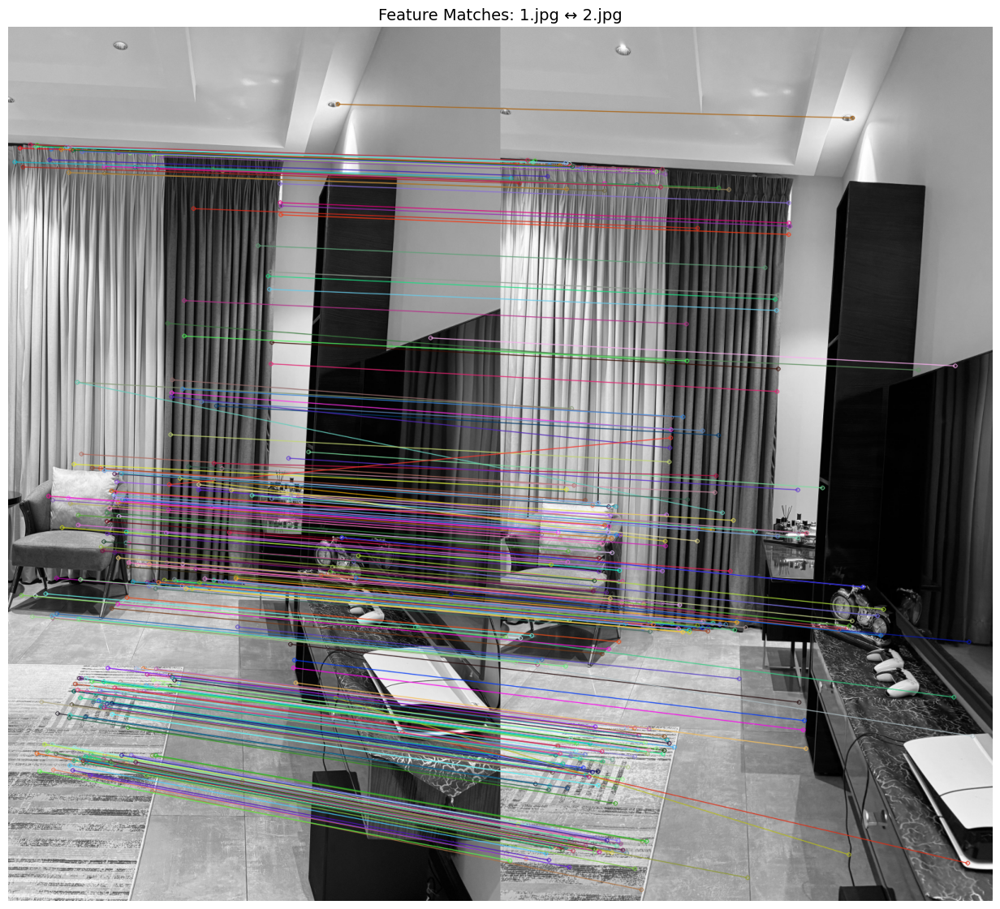

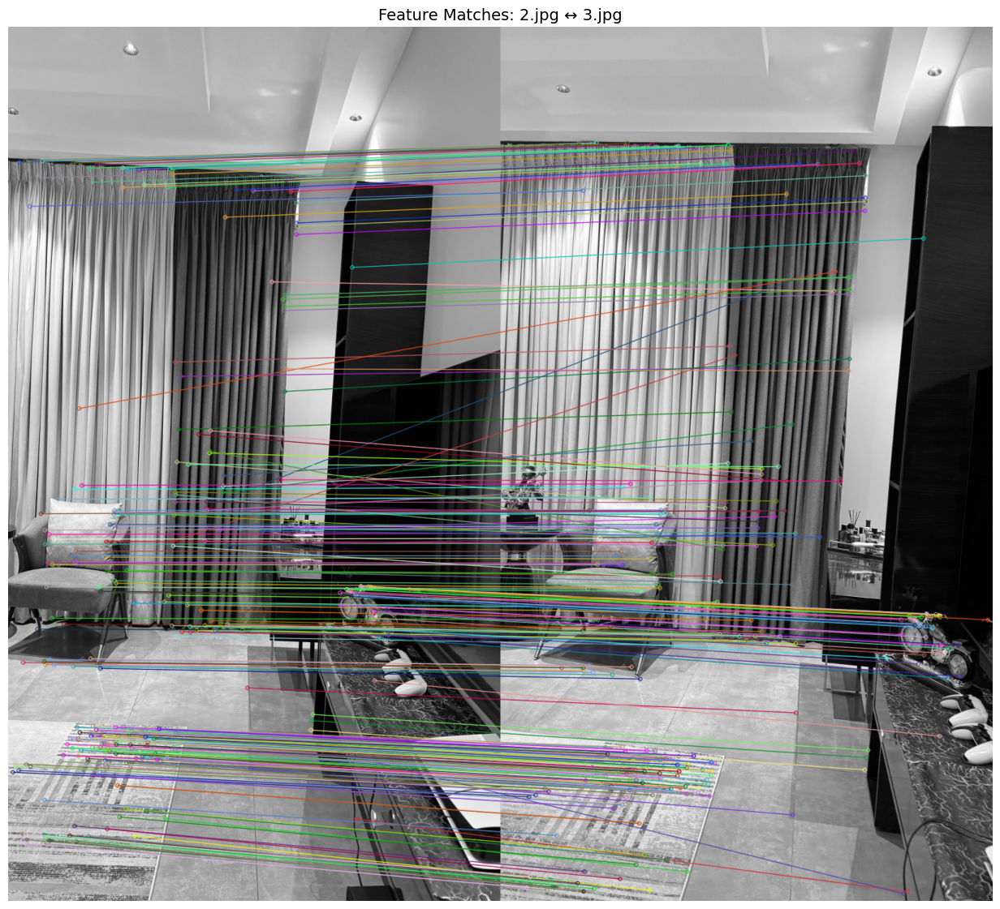

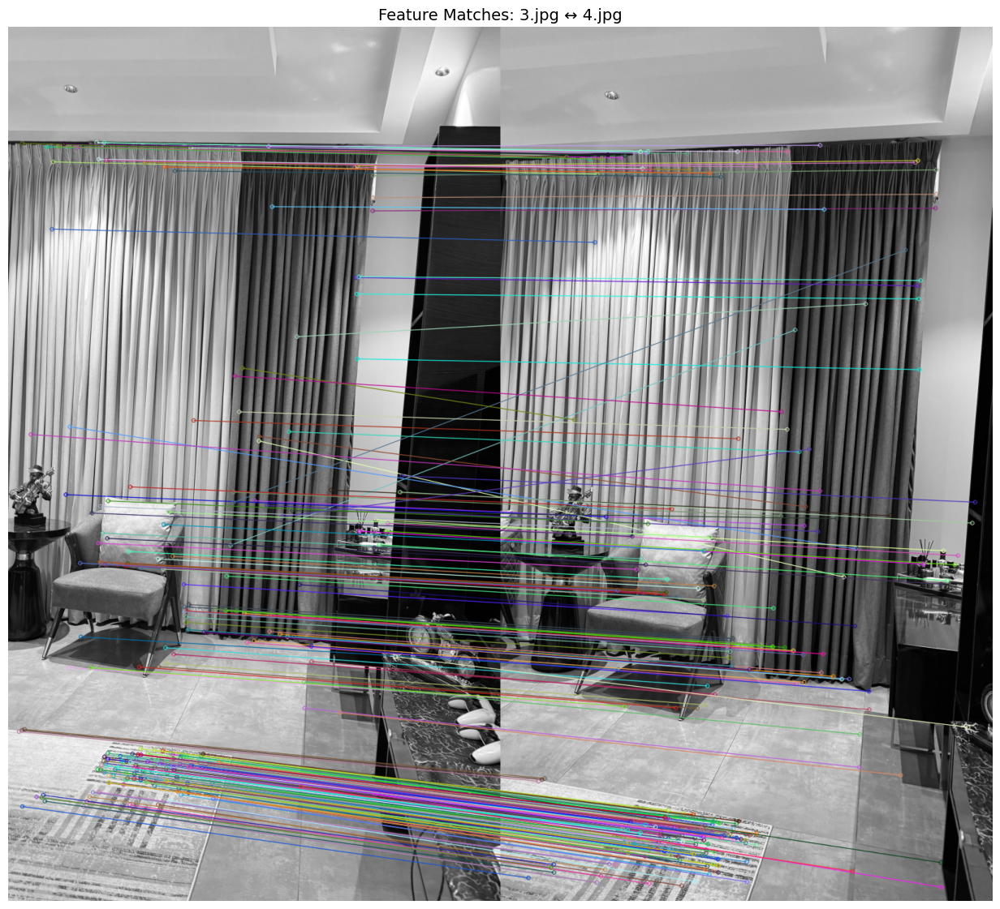

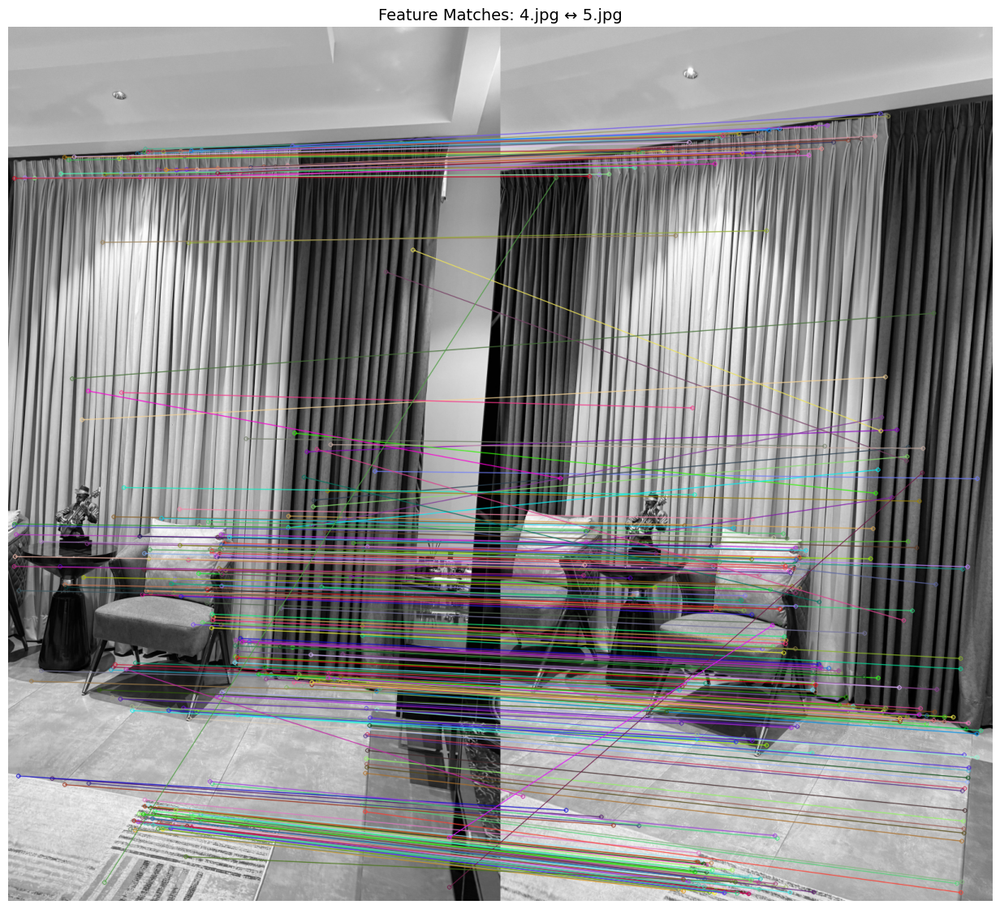

In [4]:
sift = cv2.SIFT_create()

#for keypoints and descriptors
def detect_features(image):
    keypoints, descriptors = sift.detectAndCompute(image, None)
    return keypoints, descriptors

def match_features(desc1, desc2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)
    return matches

#5 images chosen for feature mapping
consecutive_images = [cv2.imread(img) for img in example_images[:5]]
preprocessed_images = [preprocess_image_gray(img) for img in consecutive_images]

keypoints_list = []
descriptors_list = []
for img in preprocessed_images:
    kp, des = detect_features(img)
    keypoints_list.append(kp)
    descriptors_list.append(des)

matches_list = []
for i in range(len(descriptors_list) - 1):
    matches = match_features(descriptors_list[i], descriptors_list[i + 1])
    matches_list.append(matches)

def visualize_matches(img1, img2, kp1, kp2, matches, num_matches=100, title=None):
    img_matches = cv2.drawMatches(
        img1, kp1, img2, kp2, matches[:num_matches], None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    plt.figure(figsize=(18, 14))
    plt.imshow(img_matches, cmap='gray')
    if title:
        plt.title(title, fontsize=14)
    else:
        plt.title("Feature Matches", fontsize=14)
    plt.axis('off')
    plt.show()


for i in range(len(preprocessed_images) - 1):
    img1_name = os.path.basename(example_images[i])
    img2_name = os.path.basename(example_images[i + 1])
    title = f"Feature Matches: {img1_name} ↔ {img2_name}"
    visualize_matches(
        preprocessed_images[i],
        preprocessed_images[i + 1],
        keypoints_list[i],
        keypoints_list[i + 1],
        matches_list[i],
        num_matches=300, #adjust this to see more or less matches (set to None to see all matches), not all matches are geometrically correct(filtering is required(probably ransac) but that is not required here in the first deliverable)
        title=title,
    )

# Week 2 — Deliverable 2 — View Reconstruction

This section performs pairwise view reconstruction between image 1 and image 2: robust matching, Fundamental and Essential matrix estimation, pose recovery, triangulation, and simple 3D visualization.
Replace the heuristic intrinsics `K` with the real camera intrinsics if available.

- Detect Features for images


In [5]:
img1 = preprocessed_images[0]
img2 = preprocessed_images[1]
if len(keypoints_list) >= 2 and descriptors_list[0] is not None and descriptors_list[1] is not None:
    kp1, des1 = keypoints_list[0], descriptors_list[0]
    kp2, des2 = keypoints_list[1], descriptors_list[1]
else:
    kp1, des1 = detect_features(img1)
    kp2, des2 = detect_features(img2)


- Perform KNN Feature Matching

In [6]:
bf = cv2.BFMatcher()
raw_matches = bf.knnMatch(des1, des2, k=2)

good = []
ratio_thresh = 0.75
for m_n in raw_matches:
    if len(m_n) < 2:
        continue
    m, n = m_n
    if m.distance < ratio_thresh * n.distance:
        good.append(m)

print('Good matches after ratio test:', len(good))
if len(good) < 8:
    raise RuntimeError(f'Not enough matches after ratio test: {len(good)}')

pts1 = np.float32([kp1[m.queryIdx].pt for m in good])
pts2 = np.float32([kp2[m.trainIdx].pt for m in good])

Good matches after ratio test: 1004


- Fundamental Matrix with RANSAC

In [7]:
F, fm_mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC, 3.0, 0.99)
if F is None or F.shape != (3,3):
    print("Warning: Fundamental matrix computation failed or returned unexpected result.")
else:
    print("Estimated Fundamental matrix (for reference).\n", F)
    

Estimated Fundamental matrix (for reference).
 [[-5.72603305e-06 -5.24405203e-04  3.26010344e-01]
 [ 5.29119043e-04 -7.55487936e-06 -1.25364195e-01]
 [-3.52329977e-01  1.38275409e-01  1.00000000e+00]]


- Scaled Intrinsic Matrix

In [8]:
W_old, H_old = 5712.0, 4284.0
W_new, H_new = img1.shape[1], img1.shape[0]  
s_x = W_new / W_old
s_y = H_new / H_old


fx_old = 5545.082
fy_old = 5545.082
cx_old = 2856.0
cy_old = 2142.0

fx = fx_old * s_x
fy = fy_old * s_y
cx = cx_old * s_x
cy = cy_old * s_y

K = np.array([[fx, 0.0, cx],
              [0.0, fy, cy],
              [0.0, 0.0, 1.0]], dtype=np.float64)

print("Intrinsic Matrix K:\n", K)


Intrinsic Matrix K:
 [[7.86329905e+02 0.00000000e+00 4.05000000e+02]
 [0.00000000e+00 1.86389311e+03 7.20000000e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


- Essential Matrix + Filter Inliers

In [9]:
E, emask = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, prob=0.999, threshold=1.0)
if E is None:
    raise RuntimeError("Essential matrix estimation failed.")


emask = emask.ravel().astype(bool)
pts1_in = pts1[emask]
pts2_in = pts2[emask]

print("Essential Matrix:\n",E)
print("Inlier matches after Essential RANSAC:", pts1_in.shape[0])
if pts1_in.shape[0] < 8:
    raise RuntimeError("Not enough inlier correspondences after Essential RANSAC.")


Essential Matrix:
 [[-0.00276939 -0.70121905 -0.01825084]
 [ 0.70043155 -0.00551076  0.09675803]
 [-0.00212767 -0.08912431 -0.00256532]]
Inlier matches after Essential RANSAC: 823


- Camera Pose (R, t)

In [10]:
_, R, t, pose_mask = cv2.recoverPose(E, pts1_in, pts2_in, K)
pose_mask = pose_mask.ravel().astype(bool)
print("Recovered pose: inliers used by recoverPose =", int(_))
print("R:\n", R)
print("t:\n", t.ravel())

Recovered pose: inliers used by recoverPose = 823
R:
 [[ 0.99993187 -0.00423226  0.01087844]
 [ 0.00392017  0.99958461  0.02855224]
 [-0.01099476 -0.02850765  0.99953311]]
t:
 [ 0.12610383 -0.00251481 -0.99201386]


- Normalize Points + Triangulate 3D Structure

In [11]:
pts1_norm = cv2.undistortPoints(pts1_in.reshape(-1,1,2), K, None).reshape(-1,2)
pts2_norm = cv2.undistortPoints(pts2_in.reshape(-1,1,2), K, None).reshape(-1,2)

P0 = np.hstack((np.eye(3), np.zeros((3,1))))        
P1 = np.hstack((R, t))                            

pts4d_h = cv2.triangulatePoints(P0, P1, pts1_norm.T, pts2_norm.T)  
pts3d = (pts4d_h[:3] / pts4d_h[3]).T   
print('Triangulated 3D points:', pts3d.shape)

Triangulated 3D points: (823, 3)


- Positive Depth Test

check that each triangulated point lies in front of both cameras

In [12]:
z0 = pts3d[:,2]
pts1_cam = (R @ pts3d.T) + t #rotates the 3D points into camera 1’s orientation + translates
z1 = pts1_cam[2,:]

n_positive_both = np.sum((z0 > 0) & (z1 > 0))
print("Number of points with positive depth in both cameras:", n_positive_both, "out of", pts3d.shape[0])
P0_pix = K @ P0
P1_pix = K @ P1


Number of points with positive depth in both cameras: 823 out of 823


- Reprojection Error Evaluation

In [13]:
def reprojection_error(pts3d, Ppix, pts2d_pixels):
    pts_h = np.hstack((pts3d, np.ones((pts3d.shape[0],1))))
    proj = (Ppix @ pts_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]
    err = np.linalg.norm(proj - pts2d_pixels, axis=1)
    return err

pts1_in = pts1_in.reshape(-1,2)
pts2_in = pts2_in.reshape(-1,2)
err1 = reprojection_error(pts3d, P0_pix, pts1_in)
err2 = reprojection_error(pts3d, P1_pix, pts2_in)
print('Mean reprojection error (view1):', np.mean(err1))
print('Mean reprojection error (view2):', np.mean(err2))

Mean reprojection error (view1): 0.22526464402368457
Mean reprojection error (view2): 0.2540957282267749


- Inlier Matches

the matches that agree with the Fundamental/Essential Matrix and therefore fit the actual camera motion and scene structure

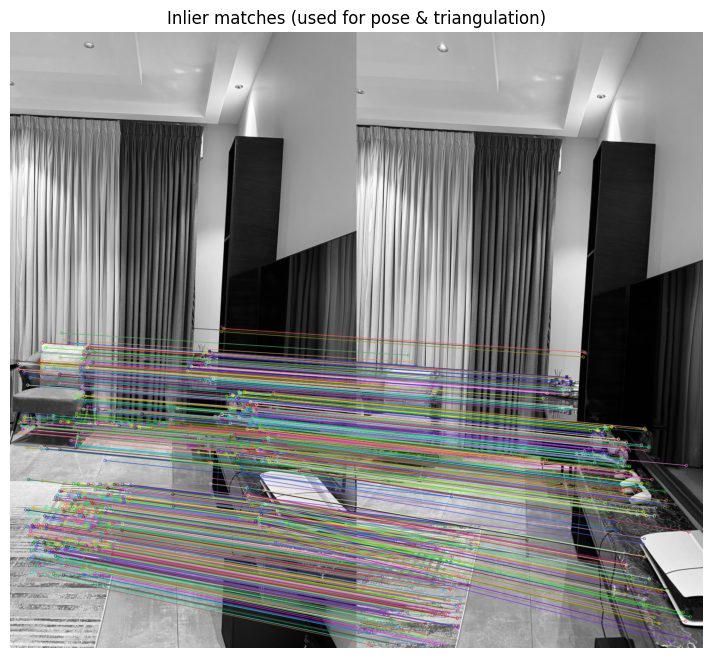

In [14]:
def draw_inlier_matches(img1, img2, kp1, kp2, matches, inlier_mask, max_draw=1000): # not showing all matches, can increase the max_draw value to see more
    draw = []
    for i, m in enumerate(matches):
        if inlier_mask[i] and len(draw) < max_draw:
            draw.append(m)
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, draw, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(14, 8))
    
    if img_matches.ndim == 2:
        plt.imshow(img_matches, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    plt.title('Inlier matches (used for pose & triangulation)')
    plt.axis('off')
    plt.show()

img1_bgr = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR) if img1.ndim==2 else img1
img2_bgr = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR) if img2.ndim==2 else img2

draw_inlier_matches(img1_bgr, img2_bgr, kp1, kp2, good, emask)


- 3D Point Cloud Visualization

    This plots the triangulated 3D points in a camera-centered coordinate frame using a 3D scatter plot. It allows us to visually inspect the reconstructed scene structure obtained from the two-view geometry.

- 2D Scatter Projection

    This displays the reconstructed 3D points projected onto the X–Y plane. It provides a simple top-down view of the point cloud, making it easier to inspect its overall shape and spatial distribution.

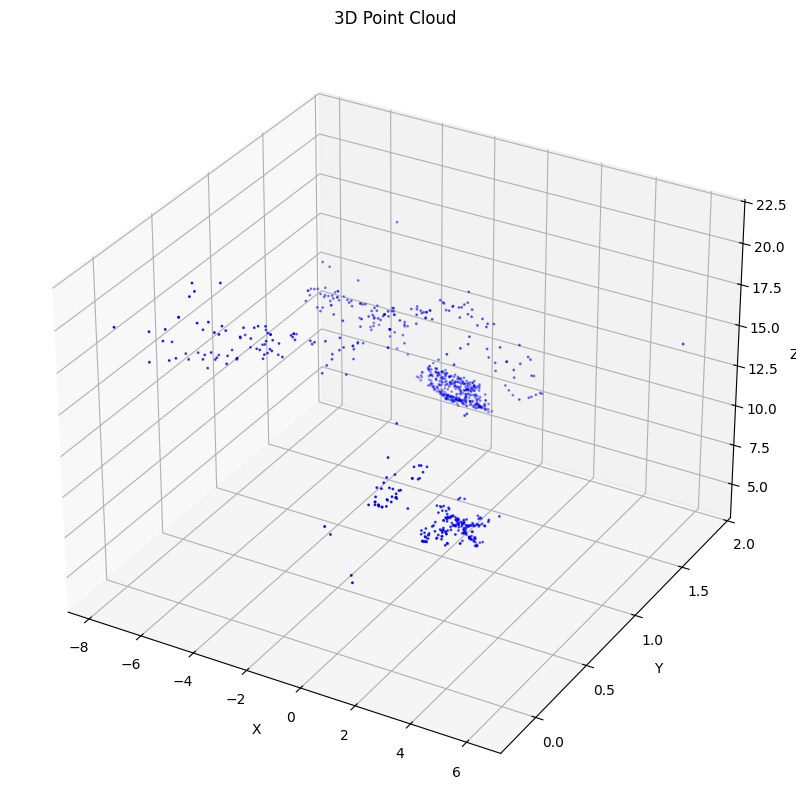

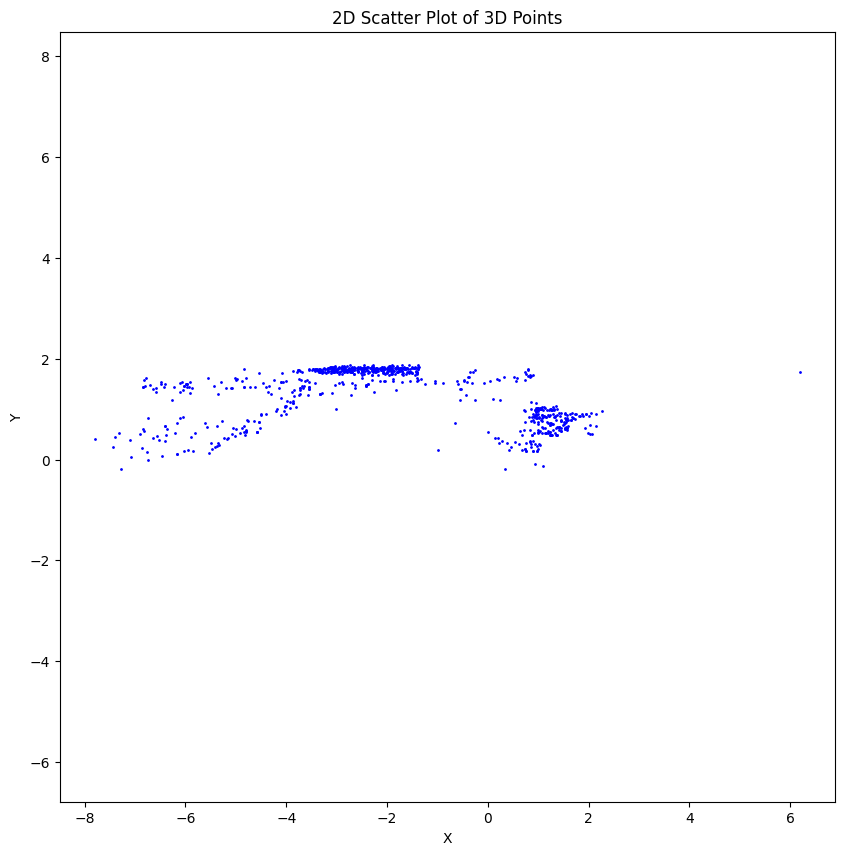

In [15]:
def plot_3d_point_cloud(points_3d):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(points_3d[:, 0], points_3d[:, 1], points_3d[:, 2], s=1, c='blue')
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    plt.title("3D Point Cloud")
    plt.show()

def plot_2d_scatter(points_3d):
    plt.figure(figsize=(10, 10))
    plt.scatter(points_3d[:, 0], points_3d[:, 1], s=1, c='blue')
    plt.title("2D Scatter Plot of 3D Points")
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.axis('equal')
    plt.show()

plot_3d_point_cloud(pts3d)
plot_2d_scatter(pts3d)

- Save 3D Point Cloud as .ply

In [16]:
def save_point_cloud_to_ply(points_3d, output_file="point_cloud.ply"):
    header = f"""ply
format ascii 1.0
element vertex {len(points_3d)}
property float x
property float y
property float z
end_header
"""
    with open(output_file, "w") as f:
        f.write(header)
        for point in points_3d:
            f.write(f"{point[0]} {point[1]} {point[2]}\n")
    print(f"Point cloud saved to {output_file}")

save_point_cloud_to_ply(pts3d)


Point cloud saved to point_cloud.ply


# Week 3

- Load ALL 40 images

In [17]:
all_images_color = [cv2.imread(img) for img in image_files[:40]]
all_images_gray  = [preprocess_image_gray(img) for img in all_images_color]

print("Loaded images:", len(all_images_gray))


Loaded images: 40


- Detect SIFT features for all 40 images

In [18]:
all_keypoints = []
all_descriptors = []

for gray in all_images_gray:
    kp, des = sift.detectAndCompute(gray, None)
    all_keypoints.append(kp)
    all_descriptors.append(des)

print("Feature extraction done.")


Feature extraction done.


- Compute matches between every consecutive pair

In [19]:
all_matches = []

for i in range(39):
    matches = match_features(all_descriptors[i], all_descriptors[i+1])
    all_matches.append(matches)

print("Consecutive matches computed.")


Consecutive matches computed.


- Initialize global camera poses

In [20]:
camera_poses = []
camera_poses.append( (np.eye(3), np.zeros((3,1))) )  # pose of image0
camera_poses.append( (R, t) )                        # pose of image1

- Incremental pose estimation for images 2…39

In [ ]:
MIN_MATCHES = 12
PNP_MIN_INLIERS = 6
REPROJ_THRESH_PNP = 8.0
REPROJ_THRESH_TRI = 8.0
MAX_POINT_DISTANCE = 500.0
MIN_PARALLAX_DEG = 0.5
MAX_LOCAL_POINTS = 300
K_BA = 5
BA_TRIGGER_INTERVAL = 3
BA_MAX_NFEV = 200
BA_XTOL = 1e-4
BA_FTOL = 1e-4

try:
    ply = PlyData.read('point_cloud.ply')
    vertex = ply['vertex']
    global_points = np.vstack([vertex['x'], vertex['y'], vertex['z']]).T.astype(float)
    print(f"Loaded {global_points.shape[0]} points from point_cloud.ply")
except Exception:
    global_points = np.empty((0, 3), dtype=float)
    print("No PLY or failed to load — starting with empty map")

def pack_params(cam_rvecs, cam_tvecs, points3d):
    cams = []
    for r, t in zip(cam_rvecs, cam_tvecs):
        cams.append(np.hstack([r.flatten(), t.flatten()]))
    cams = np.vstack(cams).reshape(-1)
    return np.hstack([cams, points3d.reshape(-1)])

def unpack_params(x, n_cams, n_points):
    cam_params = x[:n_cams * 6].reshape((n_cams, 6))
    pts = x[n_cams * 6:].reshape((n_points, 3))
    rvecs = cam_params[:, :3]
    tvecs = cam_params[:, 3:]
    return rvecs, tvecs, pts

def ba_residuals(x, n_cams, n_points, cam_idx, pt_idx, obs_xy, K):
    rvecs, tvecs, pts3 = unpack_params(x, n_cams, n_points)
    residuals = np.zeros((len(obs_xy) * 2,))
    for i, (ci, pi) in enumerate(zip(cam_idx, pt_idx)):
        rvec = rvecs[ci]
        tvec = tvecs[ci].reshape(3, 1)
        R, _ = cv2.Rodrigues(rvec)
        X = pts3[pi]
        Xc = R @ X + tvec.flatten()
        if Xc[2] <= 1e-9:
            residuals[2*i:2*i+2] = 1000.0
            continue
        proj = K @ Xc
        proj2 = proj[:2] / proj[2]
        residuals[2*i:2*i+2] = proj2 - obs_xy[i]
    return residuals

def run_local_bundle_adjustment(cam_ids, camera_poses, kp_to_3d, all_keypoints, K, global_points,
                                max_local_points=MAX_LOCAL_POINTS, max_iters=BA_MAX_NFEV):

    point_list = []
    for (img_idx, kp_idx), pid in kp_to_3d.items():
        if img_idx in cam_ids:
            point_list.append(pid)
    point_list = sorted(set(point_list))


    if len(point_list) > max_local_points:
        point_list = point_list[-max_local_points:]

    if len(point_list) < 10:
        return None, None

    camid_to_local = {cid: i for i, cid in enumerate(cam_ids)}
    pid_to_local = {pid: i for i, pid in enumerate(point_list)}

    cam_rvecs = []
    cam_tvecs = []
    for cid in cam_ids:
        R, t = camera_poses[cid]

        try:
            U, _, VT = np.linalg.svd(R)
            R = U @ VT
        except Exception:
            pass
        rvec, _ = cv2.Rodrigues(R)
        cam_rvecs.append(rvec.flatten())
        cam_tvecs.append(t.flatten())
    cam_rvecs = np.array(cam_rvecs)
    cam_tvecs = np.array(cam_tvecs)


    cam_idx_list = []
    pt_idx_list = []
    obs_xy = []
    point_obs_count = {pid: 0 for pid in point_list}
    for (img_idx, kp_idx), pid in kp_to_3d.items():
        if img_idx in cam_ids and pid in pid_to_local:
            cam_idx_list.append(camid_to_local[img_idx])
            pt_idx_list.append(pid_to_local[pid])
            obs_xy.append(all_keypoints[img_idx][kp_idx].pt)
            point_obs_count[pid] += 1

    for pid, cnt in point_obs_count.items():
        if cnt < 2:
            return None, None

    if len(obs_xy) < 6:
        return None, None

    obs_xy = np.array(obs_xy, dtype=float)
    cam_idx_list = np.array(cam_idx_list, dtype=int)
    pt_idx_list = np.array(pt_idx_list, dtype=int)

    try:
        pts_init = global_points[point_list].astype(float)
    except Exception:
        return None, None

    x0 = pack_params(cam_rvecs, cam_tvecs, pts_init)

    try:
        res = least_squares(
            ba_residuals, x0,
            args=(len(cam_ids), len(point_list), cam_idx_list, pt_idx_list, obs_xy, K),
            verbose=0,
            xtol=BA_XTOL, ftol=BA_FTOL,
            max_nfev=max_iters,
            loss='huber', f_scale=1.0
        )
    except Exception as e:
        print("Local BA exception:", e)
        return None, None

    if not res.success and res.cost > 1e6:
        return None, None

    r_opt, t_opt, pts_opt = unpack_params(res.x, len(cam_ids), len(point_list))

    new_camera_poses = camera_poses.copy()
    for j, cid in enumerate(cam_ids):
        R_new, _ = cv2.Rodrigues(r_opt[j])
        new_camera_poses[cid] = (R_new, t_opt[j].reshape(3, 1))

    new_global_points = global_points.copy()
    for j, pid in enumerate(point_list):
        new_global_points[pid] = pts_opt[j]

    return new_camera_poses, new_global_points


camera_poses = [(np.eye(3), np.zeros((3,1), dtype=float))]  # camera 0 at origin
# global_points = np.empty((0, 3))
kp_to_3d = {}
bf = cv2.BFMatcher()

n_images = min(len(all_keypoints), len(all_descriptors))
for i in range(0, max(0, n_images - 1)):
    start_time = time.time()
    prev_idx = i
    new_idx = i + 1
    print(f"\n=== Processing image {prev_idx} -> {new_idx} ===")

    kp_prev = all_keypoints[prev_idx]
    kp_curr = all_keypoints[new_idx]
    des_prev = all_descriptors[prev_idx]
    des_curr = all_descriptors[new_idx]

    if des_prev is None or des_curr is None:
        print("No descriptors for one image; skipping")
        continue

    knn = bf.knnMatch(des_prev, des_curr, k=2)
    good = []
    for pair in knn:
        if len(pair) < 2:
            continue
        m, n = pair
        if m.distance < 0.75 * n.distance:
            good.append(m)

    print("Good matches (ratio):", len(good))
    if len(good) < MIN_MATCHES:
        print("Too few matches — skipping frame")
        continue

    world_pts = []
    image_pts = []
    for m in good:
        prev_kp_idx = m.queryIdx
        curr_kp_idx = m.trainIdx
        key_prev = (prev_idx, prev_kp_idx)
        if key_prev in kp_to_3d:
            pid = kp_to_3d[key_prev]
            if pid >= global_points.shape[0]:
                continue
            world_pts.append(global_points[pid])
            image_pts.append(kp_curr[curr_kp_idx].pt)

    print("2D-3D correspondences found:", len(world_pts))
    use_pnp = len(world_pts) >= PNP_MIN_INLIERS

    R_rel, t_rel = None, None

    if use_pnp:
        world_pts = np.array(world_pts, dtype=float)
        image_pts = np.array(image_pts, dtype=float)

        try:
            retval, rvec, tvec, inliers = cv2.solvePnPRansac(
                world_pts, image_pts, K, None, None, None,
                False, 200, REPROJ_THRESH_PNP, 0.99, cv2.SOLVEPNP_ITERATIVE
            )
        except Exception:
            try:
                retval, rvec, tvec, inliers = cv2.solvePnPRansac(
                    world_pts, image_pts, K, None,
                    reprojectionError=REPROJ_THRESH_PNP, iterationsCount=200, confidence=0.99
                )
            except Exception as ex:
                print("solvePnPRansac failed:", ex)
                retval = False
                inliers = None

        if not retval or inliers is None or len(inliers) < PNP_MIN_INLIERS:
            print("PnP failed or too few inliers; falling back to Essential")
            use_pnp = False
        else:
            try:
                inlier_world = world_pts[inliers.ravel(), :]
                inlier_img = image_pts[inliers.ravel(), :]
                cv2.solvePnPRefineLM(inlier_world, inlier_img, K, None, rvec, tvec)
            except Exception:
                pass
            R_rel, _ = cv2.Rodrigues(rvec)
            t_rel = tvec.reshape(3, 1)

    if not use_pnp:
        pts_prev = np.float32([kp_prev[m.queryIdx].pt for m in good])
        pts_curr = np.float32([kp_curr[m.trainIdx].pt for m in good])

        if pts_prev.shape[0] < 8:
            print("Too few matches for essential; skipping frame")
            continue

        E, maskE = cv2.findEssentialMat(pts_prev, pts_curr, K,
                                         method=cv2.RANSAC, prob=0.999, threshold=1.0)
        if E is None:
            print("Essential failed; skipping frame")
            continue

        inliers_count = int(np.sum(maskE)) if maskE is not None else 0
        if inliers_count < 30:
            print(f"Essential inliers too few ({inliers_count}), skipping frame")
            continue

        _, R_rel_tmp, t_rel_tmp, maskPose = cv2.recoverPose(E, pts_prev, pts_curr, K)
        R_rel = R_rel_tmp
        t_rel = t_rel_tmp.reshape(3, 1)

    if R_rel is None or t_rel is None:
        print("Pose estimation failed; skipping")
        continue

    R_prev, t_prev = camera_poses[-1]
    if use_pnp:
        R_new_global = R_rel
        t_new_global = t_rel
    else:
        R_new_global = R_rel @ R_prev
        t_new_global = t_rel + R_rel @ t_prev

    camera_poses.append((R_new_global, t_new_global))

    P_prev = K @ np.hstack((R_prev, t_prev))
    P_curr = K @ np.hstack((R_new_global, t_new_global))
    pts_prev = np.float32([kp_prev[m.queryIdx].pt for m in good])
    pts_curr = np.float32([kp_curr[m.trainIdx].pt for m in good])

    if pts_prev.shape[0] < 2:
        print("Not enough points to triangulate; continuing")
        continue

    pts4d = cv2.triangulatePoints(P_prev, P_curr, pts_prev.T, pts_curr.T)
    pts3 = (pts4d[:3] / (pts4d[3] + 1e-12)).T

    clean_matches = []
    for k, p3 in enumerate(pts3):
        match = good[k]
        X_prev_cam = R_prev @ p3.reshape(3, 1) + t_prev
        X_curr_cam = R_new_global @ p3.reshape(3, 1) + t_new_global
        if X_prev_cam[2, 0] <= 1e-6 or X_curr_cam[2, 0] <= 1e-6:
            continue
        dist = np.linalg.norm(p3)
        if not np.isfinite(dist) or dist > MAX_POINT_DISTANCE:
            continue
        proj_prev = (K @ X_prev_cam).ravel()
        proj_prev = proj_prev[:2] / proj_prev[2]
        err_prev = np.linalg.norm(proj_prev - pts_prev[k])
        proj_curr = (K @ X_curr_cam).ravel()
        proj_curr = proj_curr[:2] / proj_curr[2]
        err_curr = np.linalg.norm(proj_curr - pts_curr[k])
        if max(err_prev, err_curr) > REPROJ_THRESH_TRI:
            continue
        C_prev = (-R_prev.T @ t_prev).ravel()
        C_curr = (-R_new_global.T @ t_new_global).ravel()
        v1 = p3 - C_prev
        v2 = p3 - C_curr
        denom = (np.linalg.norm(v1) * np.linalg.norm(v2))
        if denom <= 1e-8:
            continue
        cosang = np.dot(v1, v2) / denom
        cosang = np.clip(cosang, -1.0, 1.0)
        ang_deg = math.degrees(math.acos(cosang))
        if ang_deg < MIN_PARALLAX_DEG:
            continue
        clean_matches.append((match, p3))

    added = 0
    for match, p3 in clean_matches:
        prev_kp_idx = match.queryIdx
        curr_kp_idx = match.trainIdx
        key_prev = (prev_idx, prev_kp_idx)
        key_curr = (new_idx, curr_kp_idx)
        if key_curr in kp_to_3d or key_prev in kp_to_3d:
            continue
        pid = global_points.shape[0]
        if global_points.shape[0] == 0:
            global_points = np.vstack((global_points, p3.reshape(1, 3)))
        else:
            global_points = np.vstack((global_points, p3.reshape(1, 3)))
        kp_to_3d[key_prev] = pid
        kp_to_3d[key_curr] = pid
        added += 1

    print("Added points this step:", added)
    print("Total global points:", global_points.shape[0])


Loaded 823 points from point_cloud.ply

=== Processing image 0 -> 1 ===
Good matches (ratio): 1004
2D-3D correspondences found: 0
Added points this step: 931
Total global points: 931

=== Processing image 1 -> 2 ===
Good matches (ratio): 1054
2D-3D correspondences found: 458
Added points this step: 535
Total global points: 1466

=== Processing image 2 -> 3 ===
Good matches (ratio): 1000
2D-3D correspondences found: 202
Added points this step: 722
Total global points: 2188

=== Processing image 3 -> 4 ===
Good matches (ratio): 533
2D-3D correspondences found: 220
Added points this step: 273
Total global points: 2461

=== Processing image 4 -> 5 ===
Good matches (ratio): 575
2D-3D correspondences found: 128
Added points this step: 385
Total global points: 2846

=== Processing image 5 -> 6 ===
Good matches (ratio): 729
2D-3D correspondences found: 214
Added points this step: 463
Total global points: 3309

=== Processing image 6 -> 7 ===
Good matches (ratio): 568
2D-3D correspondences foun

- Save & Plot final multi-view point cloud

In [ ]:

def view_point_cloud_o3d(points, point_size=3):
    if points.shape[0] == 0:
        print("No points to visualize.")
        return
    
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    vis = o3d.visualization.Visualizer()
    vis.create_window(window_name="SfM 3D Reconstruction", width=1280, height=720)
    vis.add_geometry(pcd)
    opt = vis.get_render_option()
    opt.point_size = point_size
    opt.background_color = np.asarray([0, 0, 0])

    vis.run()
    vis.destroy_window()

view_point_cloud_o3d(global_points)



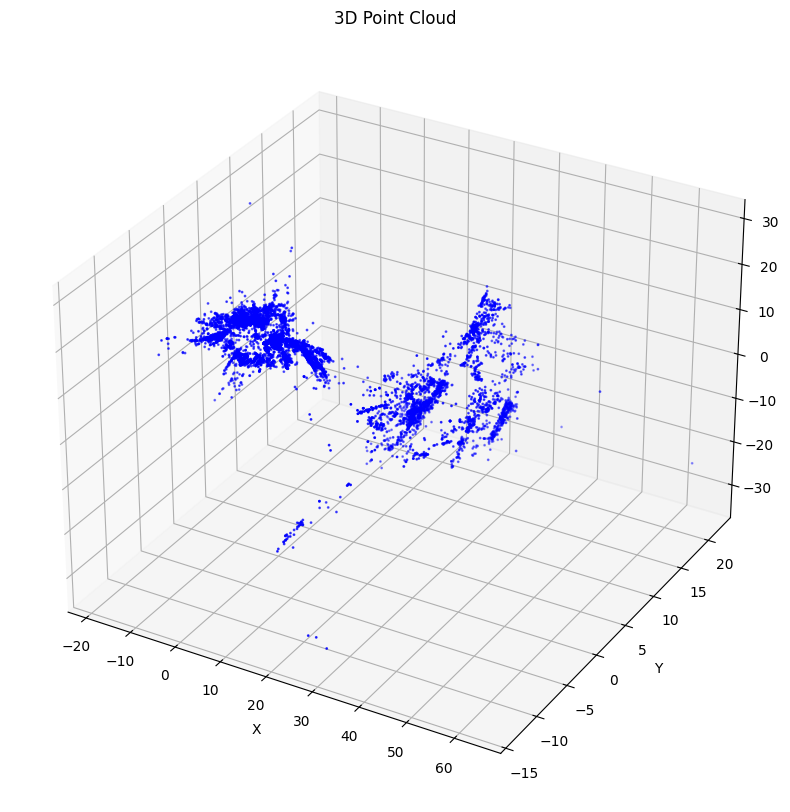

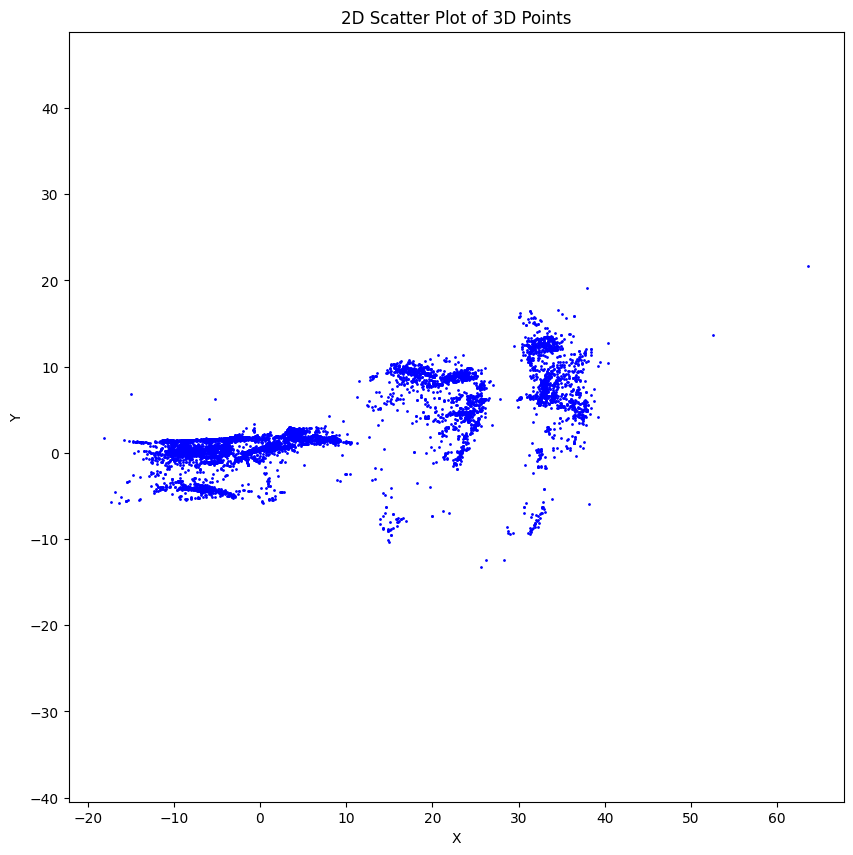

Point cloud saved to sfm_multiview.ply


In [40]:
plot_3d_point_cloud(global_points)
plot_2d_scatter(global_points)
save_point_cloud_to_ply(global_points, "sfm_multiview.ply")